In [1]:
# Firstly, some necessary imports

# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Imports from eo-learn and sentinelhub-py
from eolearn.core.eoworkflow import LinearWorkflow, Dependency
from eolearn.core.eodata import FeatureType
from sentinelhub import BBox, CRS
import numpy as np
import matplotlib.pyplot as plt
import datetime
from eolearn.core import SaveToDisk, LoadFromDisk
from eolearn.io import S2L1CWCSInput, AddSen2CorClassificationFeature, DEMWCSInput, S2L2AWCSInput, L8L1CWCSInput, SentinelHubWMSInput, SentinelHubWCSInput
from sentinelhub import WmsRequest, WcsRequest, MimeType, CRS, BBox, DataSource, constants, BBoxSplitter

In [2]:
# Firstly, some necessary imports

# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import pickle
import sys
import os
import datetime
import itertools
from aenum import MultiValueEnum

# Basics of Python data handling and visualization
import numpy as np
np.random.seed(42)
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon
from tqdm.auto import tqdm


# Imports from eo-learn and sentinelhub-py
from eolearn.core import EOTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, \
    LoadTask, SaveTask, EOExecutor, ExtractBandsTask, MergeFeatureTask
from eolearn.io import SentinelHubInputTask, ExportToTiff
from eolearn.mask import AddMultiCloudMaskTask, AddValidDataMaskTask
from eolearn.geometry import VectorToRaster, PointSamplingTask, ErosionTask
from eolearn.features import LinearInterpolation, SimpleFilterTask, NormalizedDifferenceIndexTask
from sentinelhub import UtmZoneSplitter, BBox, CRS, DataSource

In [3]:
from sentinelhub import SHConfig


INSTANCE_ID = 'da9a30c7-00e2-4dde-88a0-bdcd480e106f'  # In case you put instance ID into configuration file you can leave this unchanged

if INSTANCE_ID:
    config = SHConfig()
    config.instance_id = INSTANCE_ID
else:
    config = None

Dimension of the area is 243184 x 161584 m2


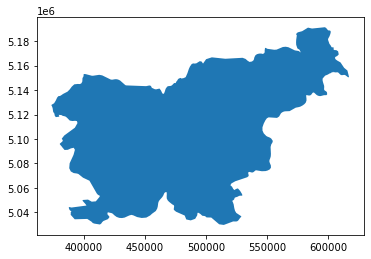

In [4]:
#example
# Load geojson file
country = gpd.read_file('svn_border.geojson')
country = country.buffer(500)
# Get the country's shape in polygon format
country_shape = country.geometry.values[-1]
# Plot country
country.plot()
#plt.axis('off');

# Print size
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(country_shape.bounds[2] - country_shape.bounds[0],
                                                             country_shape.bounds[3] - country_shape.bounds[1]))


In [5]:
# Create the splitter to obtain a list of bboxes
bbox_splitter = UtmZoneSplitter([country_shape], country.crs, 5000)

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [info['index'] for info in info_list]
idxs_x = [info['index_x'] for info in info_list]
idxs_y = [info['index_y'] for info in info_list]

gdf = gpd.GeoDataFrame({'index': idxs, 'index_x': idxs_x, 'index_y': idxs_y},
                           crs=country.crs,
                           geometry=geometry)

# select a 5x5 area (id of center patch)
ID = 616

# Obtain surrounding 5x5 patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[ID]['index_x']) <= 2 and
        abs(info['index_y'] - info_list[ID]['index_y']) <= 2):
        patchIDs.append(idx)

# Check if final size is 5x5
if len(patchIDs) != 5*5:
    print('Warning! Use a different central patch ID, this one is on the border.')

# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(5, 5))).ravel()

# save to shapefile
shapefile_name = './grid_slovenia_500x500.gpkg'
gdf.to_file(shapefile_name, driver='GPKG')

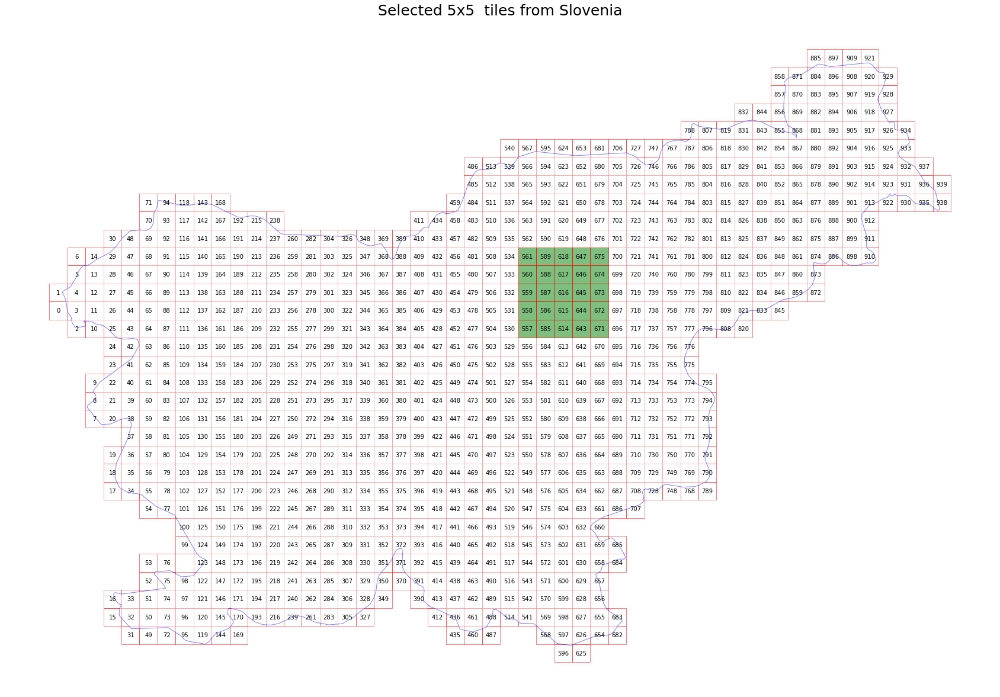

In [6]:
# figure
fig, ax = plt.subplots(figsize=(30, 30))
gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5)
country.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Selected 5x5  tiles from Slovenia', fontsize=25);
for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info['index'], ha='center', va='center')

gdf[gdf.index.isin(patchIDs)].plot(ax=ax,facecolor='g',edgecolor='r',alpha=0.5)

plt.axis('off');

In [7]:
#recreate with our data
#Tres Cantos Spain
delta=0.004
delta_lat=0.003
top_left_lat = 40.608715 - delta_lat
top_left_long = -3.727144 + delta
bottom_right_lat = 40.590063 +delta_lat
bottom_right_long = -3.701583 -delta
coords_wgs84 = [top_left_long, top_left_lat, bottom_right_long, bottom_right_lat]
coords_wgs84 = BBox(bbox=coords_wgs84, crs=CRS.WGS84)

In [8]:
#parallelo tra coords_wgs84 e country shape
type(country), type(country_shape), country.crs


(geopandas.geoseries.GeoSeries,
 shapely.geometry.polygon.Polygon,
 <Projected CRS: EPSG:32633>
 Name: WGS 84 / UTM zone 33N
 Axis Info [cartesian]:
 - E[east]: Easting (metre)
 - N[north]: Northing (metre)
 Area of Use:
 - name: World - N hemisphere - 12°E to 18°E - by country
 - bounds: (12.0, 0.0, 18.0, 84.0)
 Coordinate Operation:
 - name: UTM zone 33N
 - method: Transverse Mercator
 Datum: World Geodetic System 1984
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [9]:
area = gpd.GeoSeries(coords_wgs84.geometry)
area.crs = "EPSG:4326"
area_shape = area.geometry.values[-1]
type(area) ,type(area_shape), area.crs

(geopandas.geoseries.GeoSeries,
 shapely.geometry.polygon.Polygon,
 <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

Dimension of the area is 1497 x 1416 m2


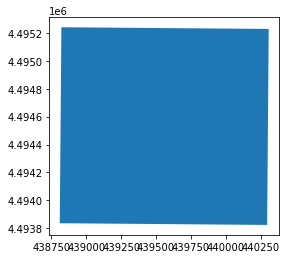

In [10]:
#project
#area = area.to_crs("EPSG:3035")
area = area.to_crs("EPSG:32627")#27N
area = area.to_crs("EPSG:32630")#30N

area_shape = area.geometry.values[-1]
area_shape._crs = area.crs
# Plot
area.plot()
#plt.axis('off');

# Print size
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(area_shape.bounds[2] - area_shape.bounds[0],
                                                             area_shape.bounds[3] - area_shape.bounds[1]))

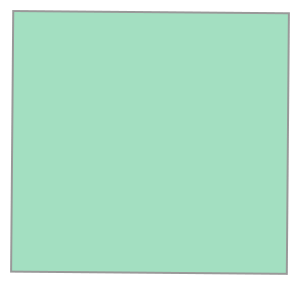

In [11]:
area_shape

In [12]:
area.crs

<Projected CRS: EPSG:32630>
Name: WGS 84 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - N hemisphere - 6°W to 0°W - by country
- bounds: (-6.0, 0.0, 0.0, 84.0)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [13]:
info_list[0],area.crs

({'crs': 'UTM_33N',
  'utm_zone': '33',
  'utm_row': '',
  'direction': 'N',
  'index': 0,
  'index_x': 0,
  'index_y': 19},
 <Projected CRS: EPSG:32630>
 Name: WGS 84 / UTM zone 30N
 Axis Info [cartesian]:
 - E[east]: Easting (metre)
 - N[north]: Northing (metre)
 Area of Use:
 - name: World - N hemisphere - 6°W to 0°W - by country
 - bounds: (-6.0, 0.0, 0.0, 84.0)
 Coordinate Operation:
 - name: UTM zone 30N
 - method: Transverse Mercator
 Datum: World Geodetic System 1984
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [14]:
# Create the splitter to obtain a list of bboxes
bbox_splitter = UtmZoneSplitter([area_shape], "EPSG:32630", 50)

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())
bbox_list[0]._crs

CRS('32630')

In [15]:
# Create the splitter to obtain a list of bboxes
bbox_splitter = UtmZoneSplitter([area_shape], area.crs, 100)

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [info['index'] for info in info_list]
idxs_x = [info['index_x'] for info in info_list]
idxs_y = [info['index_y'] for info in info_list]

gdf = gpd.GeoDataFrame({'index': idxs, 'index_x': idxs_x, 'index_y': idxs_y},
                           crs=area.crs,
                           geometry=geometry)

# select a 5x5 area (id of center patch)
ID = 100

# Obtain surrounding 5x5 patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[ID]['index_x']) <= 2 and
        abs(info['index_y'] - info_list[ID]['index_y']) <= 2):
        patchIDs.append(idx)

# Check if final size is 5x5
if len(patchIDs) != 5*5:
    print('Warning! Use a different central patch ID, this one is on the border.')

# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(5, 5))).ravel()

# save to shapefile
shapefile_name = './grid_slovenia_500x500.gpkg'
gdf.to_file(shapefile_name, driver='GPKG')

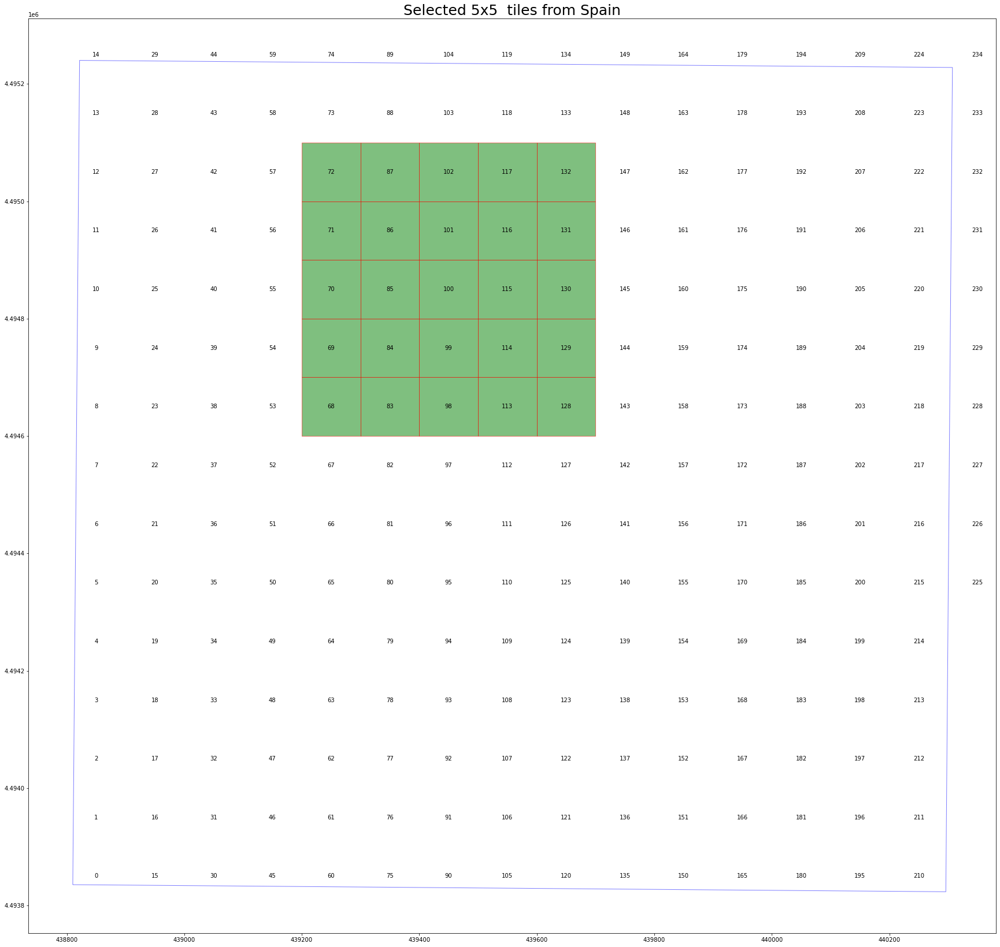

In [57]:
# figure
fig, ax = plt.subplots(figsize=(30, 30))
#gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5)
area.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Selected 5x5  tiles from Spain', fontsize=25);
for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info['index'], ha='center', va='center')

gdf[gdf.index.isin(patchIDs)].plot(ax=ax,facecolor='g',edgecolor='r',alpha=0.5)
#plt.plot(wcs_true_color_data[0], ax=ax)
#plt.imshow(wcs_true_color_data[0])
#plt.axis('off');

In [17]:
#let's load data
layer = 'TRUE-COLOR'

collection_id = 'cd0bc245-5d71-41aa-bb72-c09f8e89a53c'

input_task = SentinelHubWCSInput(
    data_source=DataSource(collection_id),
    layer=layer,
    resx='0.3m',
    resy='0.3m',
    instance_id = 'dd060ae7-b4ff-4576-a1e6-8d5f18514ebf',
    image_format=constants.MimeType.TIFF_d8,
)


save = SaveTask('io_example', overwrite_permission=2, compress_level=1)

workflow = LinearWorkflow(
    input_task,
    save
)

# Let's visualize it
#workflow.dependency_graph()

In [18]:
%%time

# Execute the workflow
time_interval = ('2018-04-01', '2021-05-01')

# define additional parameters of the workflow
execution_args = []
for idx, bbox in enumerate(bbox_list[patchIDs]):
    execution_args.append({
        input_task:{'bbox': bbox, 'time_interval': time_interval},
        save: {'eopatch_folder': f'eopatch_{idx}'}
    })

executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=12, multiprocess=False)

#executor.make_report()



/home/doma/anaconda3/envs/yolov3-tf2-gpu/lib/python3.7/site-packages/sentinelhub/data_request.py:47: SHDeprecationWarning: Parameter 'instance_id' is deprecated and will soon removed. Use parameter 'config' instead
  category=SHDeprecationWarning)



CPU times: user 4.44 s, sys: 611 ms, total: 5.05 s
Wall time: 5.79 s


In [19]:
eopatch = EOPatch.load('./io_example/eopatch_1', lazy_loading=True)
eopatch.data['TRUE-COLOR'].shape

(2, 333, 333, 3)

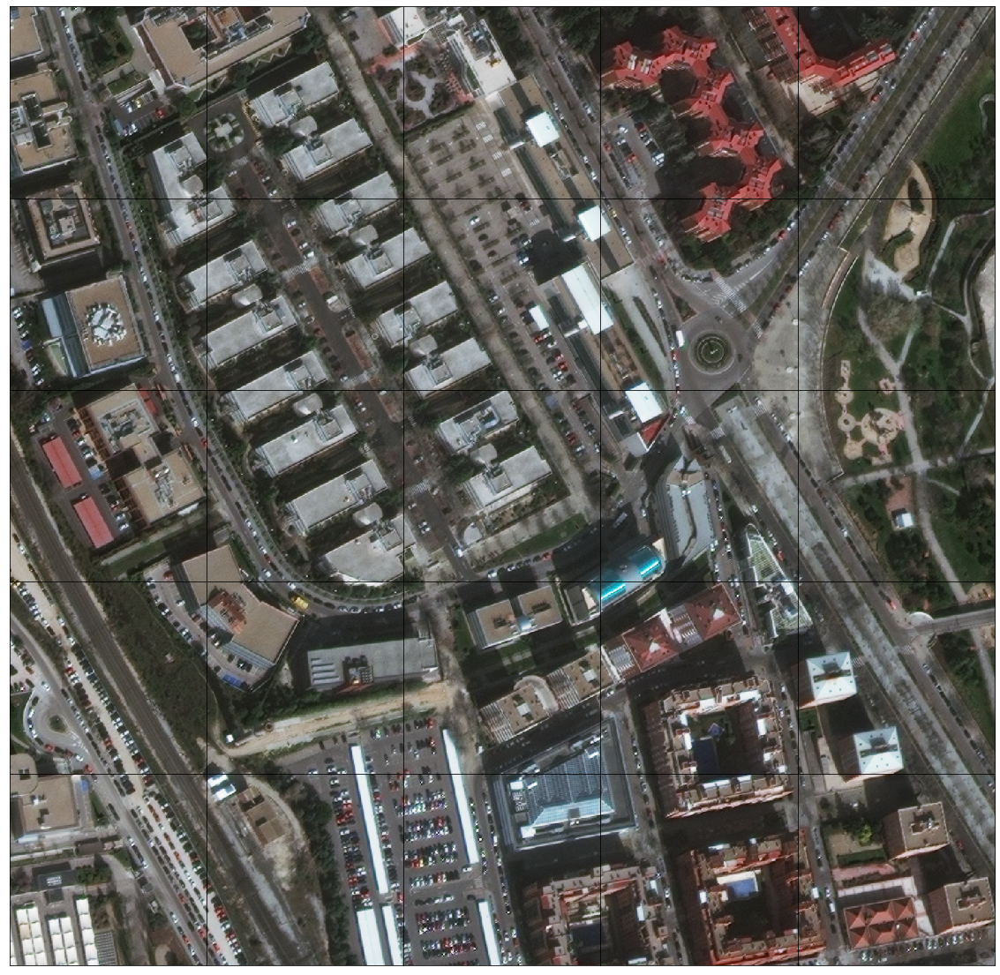

In [20]:
# Draw the RGB image
path_out = './io_example'
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

date = datetime.datetime(2019,7,1)

for i in tqdm(range(len(patchIDs))):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    ax = axs[i//5][i%5]
    dates = np.array(eopatch.timestamp)
    closest_date_id = np.argsort(abs(date-dates))[0]
    ax.imshow(eopatch.data['TRUE-COLOR'][0])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

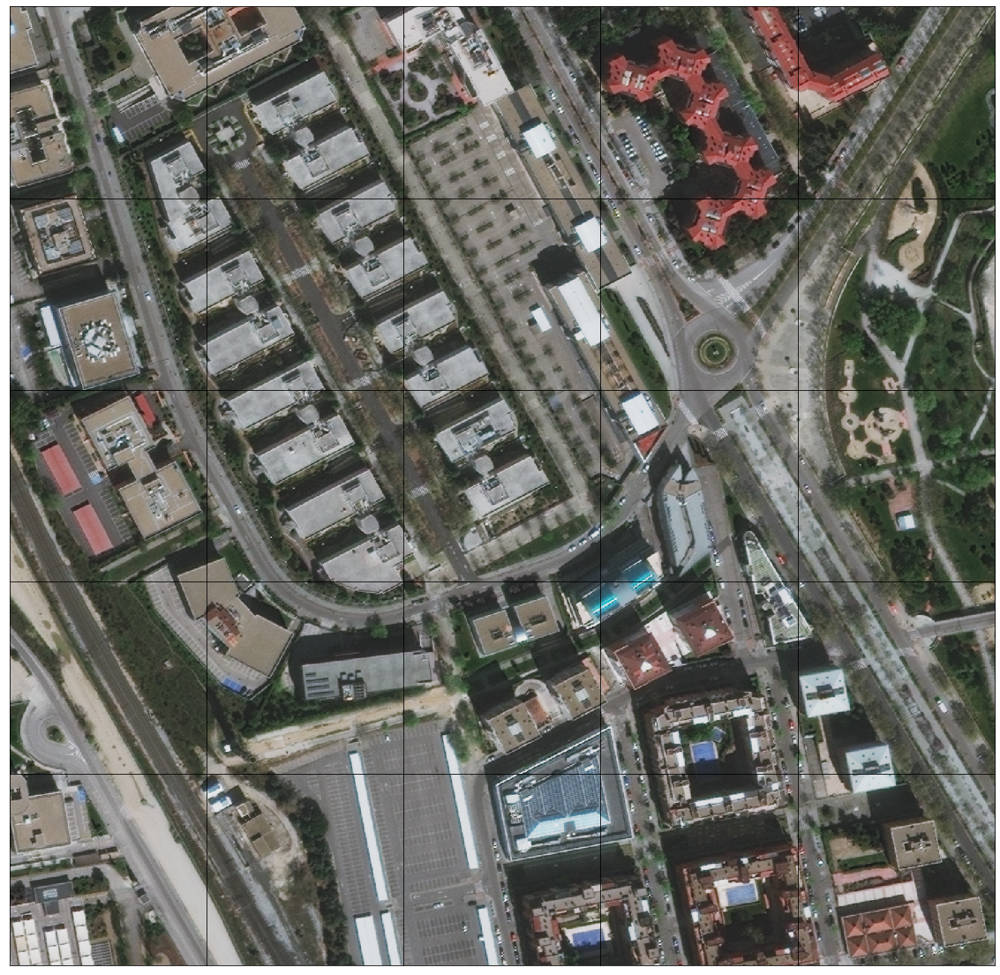

In [21]:
# Draw the RGB image
path_out = './io_example'
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

date = datetime.datetime(2019,7,1)

for i in tqdm(range(len(patchIDs))):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    ax = axs[i//5][i%5]
    dates = np.array(eopatch.timestamp)
    closest_date_id = np.argsort(abs(date-dates))[0]
    ax.imshow(eopatch.data['TRUE-COLOR'][1])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

-3.723144,40.593063,-3.705583,40.605715


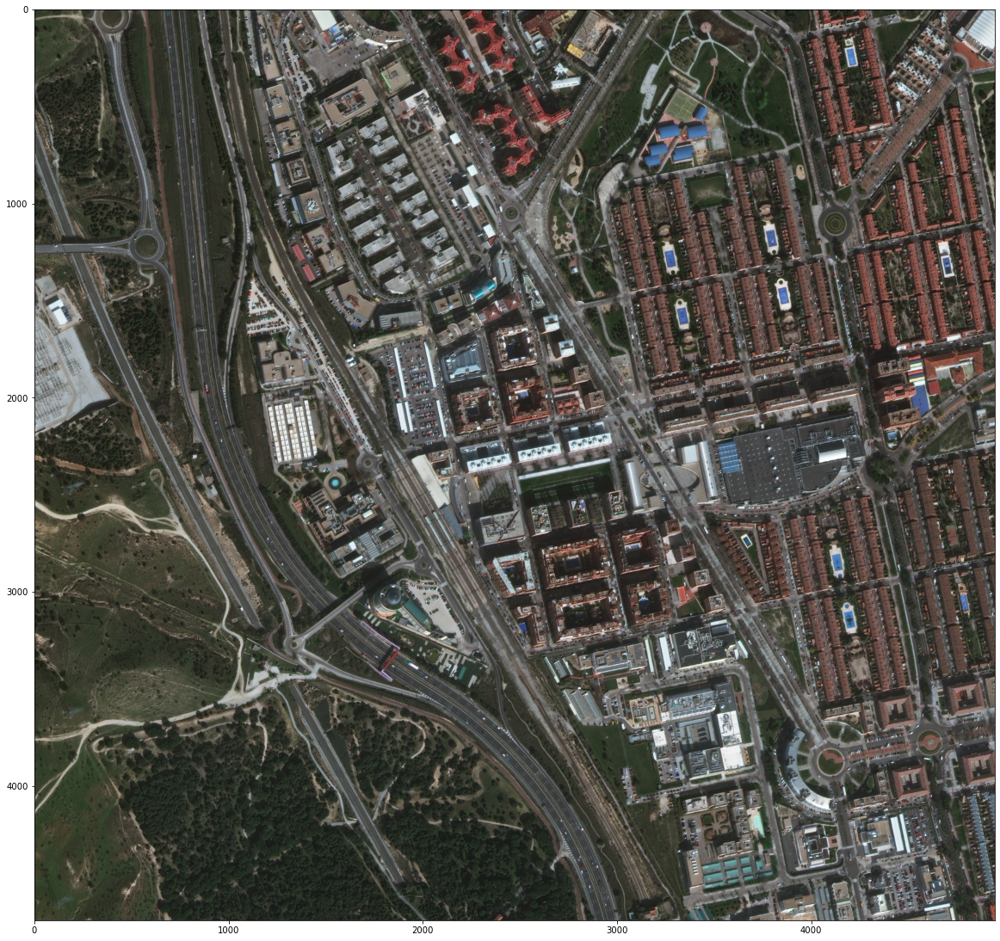

In [22]:
def plot_image(image, factor=1):
    """
    Utility function for plotting RGB images.
    """
    fig = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
    plt.imshow(image)
#Tres Cantos Spain
delta=0.004
delta_lat=0.003
top_left_lat = 40.608715 - delta_lat
top_left_long = -3.727144 + delta
bottom_right_lat = 40.590063 +delta_lat
bottom_right_long = -3.701583 -delta
coords_wgs84 = [top_left_long, top_left_lat, bottom_right_long, bottom_right_lat]
coords_wgs84 = BBox(bbox=coords_wgs84, crs=CRS.WGS84)
print(coords_wgs84)

#european imaging (30cm!)
instance_id = 'dd060ae7-b4ff-4576-a1e6-8d5f18514ebf'
layer = 'TRUE-COLOR'
#layer = '1_TRUE-COLOR'
config = SHConfig()
config.instance_id = instance_id
collection_id = 'cd0bc245-5d71-41aa-bb72-c09f8e89a53c'


wcs_true_color_request = WcsRequest(
    data_source=DataSource(collection_id),
    data_folder='tres_cantos_tiff',
    layer=layer,
    bbox=coords_wgs84,
    time=('2016-01-01', '2021-01-01'),
    image_format=constants.MimeType.TIFF_d8,
    resx='0.3m',
    resy='0.3m',
    config=config
)
wcs_true_color_data = wcs_true_color_request.get_data(save_data=True)
plot_image(wcs_true_color_data[0])


In [37]:
#run inference using eopatch as input
import tensorflow.compat.v1 as tf
import numpy as np
from tqdm import tqdm
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
tf.disable_v2_behavior()

def generate_detections(checkpoint,images):
    
    print("Creating Graph...")
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(checkpoint, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')

    boxes = []
    scores = []
    classes = []
    k = 0
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            for image_np in tqdm(images):
                print("image start")
                image_np_expanded = np.expand_dims(image_np, axis=0)
                image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
                box = detection_graph.get_tensor_by_name('detection_boxes:0')
                score = detection_graph.get_tensor_by_name('detection_scores:0')
                clss = detection_graph.get_tensor_by_name('detection_classes:0')
                num_detections = detection_graph.get_tensor_by_name('num_detections:0')
                # Actual detection.
                (box, score, clss, num_detections) = sess.run(
                        [box, score, clss, num_detections],
                        feed_dict={image_tensor: image_np_expanded})
                print("image end")
                boxes.append(box)
                scores.append(score)
                classes.append(clss)
                
    boxes =   np.squeeze(np.array(boxes))
    scores = np.squeeze(np.array(scores))
    classes = np.squeeze(np.array(classes))

    return boxes,scores,classes

"""
Inference script to generate a file of predictions given an input.

Args:
    checkpoint: A filepath to the exported pb (model) file.
        ie ("saved_model.pb")

    chip_size: An integer describing how large chips of test image should be

    input: A filepath to a single test chip
        ie ("1192.tif")

    output: A filepath where the script will save  its predictions
        ie ("predictions.txt")


Outputs:
    Writes a file specified by the 'output' parameter containing predictions for the model.
        Per-line format:  xmin ymin xmax ymax class_prediction score_prediction
        Note that the variable "num_preds" is dependent on the trained model 
        (default is 250, but other models have differing numbers of predictions)

"""

def chip_image(img, chip_size=(300,300)):
    """
    Segment an image into NxWxH chips

    Args:
        img : Array of image to be chipped
        chip_size : A list of (width,height) dimensions for chips

    Outputs:
        An ndarray of shape (N,W,H,3) where N is the number of chips,
            W is the width per chip, and H is the height per chip.

    """
    width,height,_ = img.shape
    wn,hn = chip_size
    images = np.zeros((int(width/wn) * int(height/hn),wn,hn,3))
    k = 0
    for i in tqdm(range(int(width/wn))):
        for j in range(int(height/hn)):
            
            chip = img[wn*i:wn*(i+1),hn*j:hn*(j+1),:3]
            images[k]=chip
            
            k = k + 1
    
    return images.astype(np.uint8)

def draw_bboxes(img,boxes,classes):
    """
    Draw bounding boxes on top of an image

    Args:
        img : Array of image to be modified
        boxes: An (N,4) array of boxes to draw, where N is the number of boxes.
        classes: An (N,1) array of classes corresponding to each bounding box.

    Outputs:
        An array of the same shape as 'img' with bounding boxes
            and classes drawn

    """
    source = Image.fromarray(img)
    draw = ImageDraw.Draw(source)
    w2,h2 = (img.shape[0],img.shape[1])

    idx = 0

    for i in range(len(boxes)):
        ymin,xmin,ymax,xmax = boxes[i]
        c = classes[i]
        if((float(c)==18.0) | (float(c)>1137.0)):#only cars
            draw.text((xmin+15,ymin+15), str(c))

            for j in range(4):
                draw.rectangle(((xmin+j, ymin+j), (xmax+j, ymax+j)), outline="red")
    return source
def plot_image(image, factor=1):
    """
    Utility function for plotting RGB images.
    """
    fig = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
    plt.imshow(image)

In [38]:
%%time
#old way to run inference, loading tiff image directly
model = "/home/doma/Downloads/xView1_baseline-1.1/models/vanilla.pb"
chip_size = 300
input_image = "/home/doma/ML/deep_learning/car_counting_from_space/austria_border_tiff/1adf8bed6712446d4094db7a37ffcef5/response.tiff"
output = "./output_prova.txt"
#Parse and chip images
arr = np.array(Image.open(input_image))
arr = arr[2200:4000,:,:]
chip_size = (chip_size,chip_size)
images = chip_image(arr,chip_size)
print(images.shape)

#generate detections
boxes, scores, classes = generate_detections(model,images)

100%|██████████| 6/6 [00:00<00:00, 44.52it/s]


(90, 300, 300, 3)
Creating Graph...


  0%|          | 0/90 [00:00<?, ?it/s]

image start


  1%|          | 1/90 [00:07<10:41,  7.21s/it]

image end
image start


  2%|▏         | 2/90 [00:07<07:37,  5.20s/it]

image end
image start


  3%|▎         | 3/90 [00:08<05:31,  3.81s/it]

image end
image start


  4%|▍         | 4/90 [00:08<04:03,  2.84s/it]

image end
image start


  4%|▍         | 4/90 [00:09<03:22,  2.35s/it]


KeyboardInterrupt: 

In [56]:
eopatch

EOPatch(
  data: {
    TRUE-COLOR: numpy.ndarray(shape=(2, 333, 333, 3), dtype=uint8)
  }
  mask: {
    IS_DATA: FeatureIO(/mask/IS_DATA.npy.gz)
  }
  scalar: {}
  label: {}
  vector: {}
  data_timeless: {}
  mask_timeless: {}
  scalar_timeless: {}
  label_timeless: {}
  vector_timeless: {}
  meta_info: {
    maxcc: 1.0
    service_type: 'wcs'
    size_x: '0.3m'
    size_y: '0.3m'
    time_difference: datetime.timedelta(days=-1, seconds=86399)
    time_interval: ('2018-04-01', '2021-05-01')
  }
  bbox: BBox(((439500.0, 4494900.0), (439600.0, 4495000.0)), crs=CRS('32630'))
  timestamp: [datetime.datetime(2020, 2, 28, 11, 23, 42), datetime.datetime(2020, 3, 29, 11, 20, 26)]
)

(333, 333, 3)


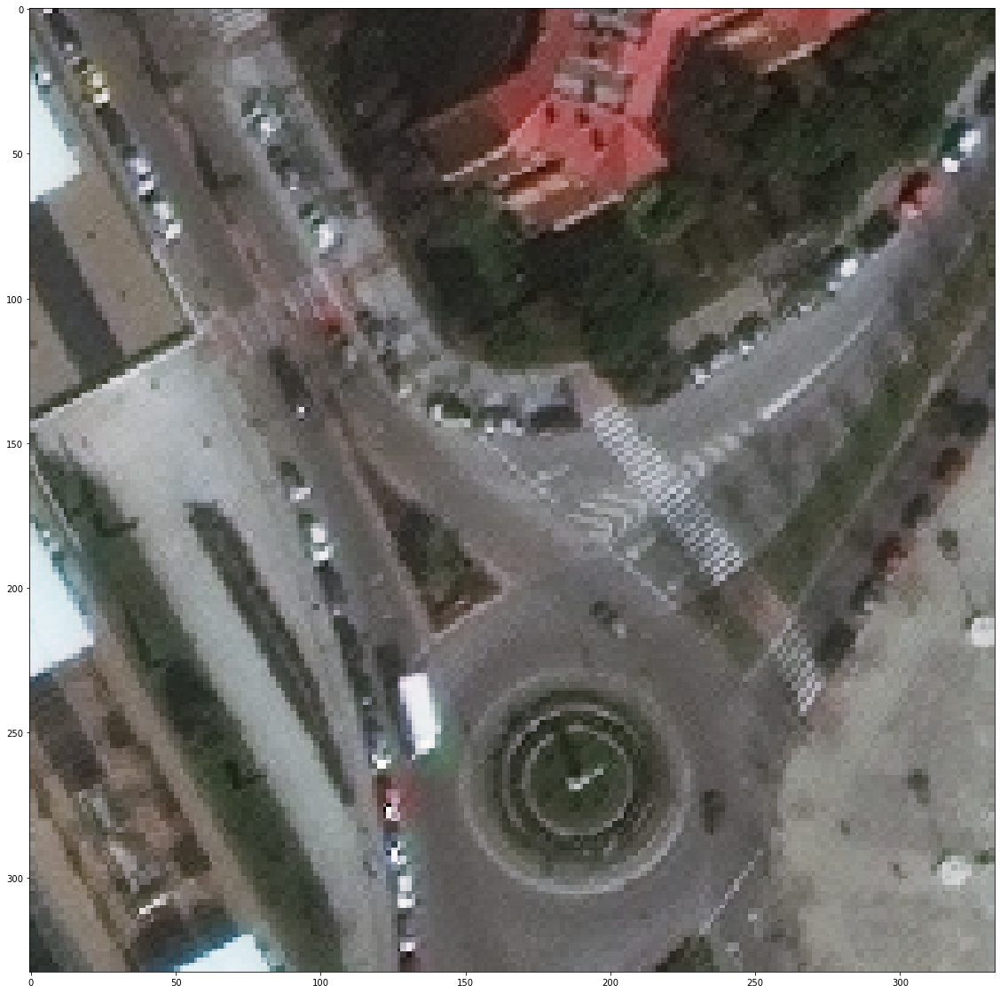

In [55]:
eopatch = EOPatch.load('./io_example/eopatch_8', lazy_loading=True)
test_image = eopatch.data['TRUE-COLOR'][0]
print(test_image.shape)
plot_image(test_image)

In [27]:
boxes, scores, classes = generate_detections(model,[test_image])

Creating Graph...


100%|██████████| 1/1 [00:06<00:00,  6.59s/it]


In [28]:
test_image.shape

(333, 333, 3)

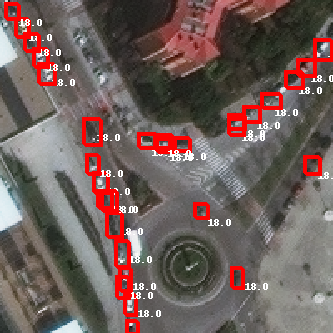

In [29]:
#Process boxes to be full-sized
width,height,_ = test_image.shape

num_preds = 250

bfull = boxes*width

#only display boxes with confidence > .5
conf=0.2
bs = bfull[scores > conf]
cs = classes[scores>conf]
draw_bboxes(test_image,bs,cs)

In [30]:
def load_graph(model):
    print("Creating Graph...")
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(model, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
                with detection_graph.as_default():
                with tf.Session(graph=detection_graph) as sess:
    return detection_graph

In [31]:
%%time
detection_graph = load_graph(model)

Creating Graph...
CPU times: user 1.97 s, sys: 304 ms, total: 2.28 s
Wall time: 2.28 s


In [32]:
def generate_detections_custom(detection_graph, image):
    print("start function")
    boxes = []
    scores = []
    classes = []
    k = 0
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:

            image_np_expanded = np.expand_dims(image, axis=0)
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            box = detection_graph.get_tensor_by_name('detection_boxes:0')
            score = detection_graph.get_tensor_by_name('detection_scores:0')
            clss = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            # Actual detection.
            print("start detection")
            (box, score, clss, num_detections) = sess.run(
                    [box, score, clss, num_detections],
                    feed_dict={image_tensor: image_np_expanded})
    return box,score,clss

In [46]:
%%time
boxes, scores, classes = generate_detections_custom(detection_graph,test_image)
boxes, scores, classes = generate_detections_custom(detection_graph,test_image)

start function
start detection
start function
start detection
CPU times: user 14.4 s, sys: 558 ms, total: 15 s
Wall time: 13.6 s


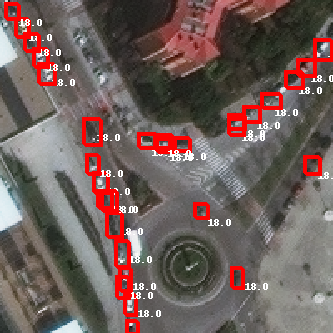

In [34]:
#Process boxes to be full-sized
width,height,_ = test_image.shape

num_preds = 250

bfull = boxes*width

#only display boxes with confidence > .5
conf=0.2
bs = bfull[scores > conf]
cs = classes[scores>conf]
draw_bboxes(test_image,bs,cs)

In [41]:
?detection_graph.as_default
detection_graph = load_graph(model)

Signature: detection_graph.as_default()
Docstring:
Returns a context manager that makes this `Graph` the default graph.

This method should be used if you want to create multiple graphs
in the same process. For convenience, a global default graph is
provided, and all ops will be added to this graph if you do not
create a new graph explicitly.

Use this method with the `with` keyword to specify that ops created within
the scope of a block should be added to this graph. In this case, once
the scope of the `with` is exited, the previous default graph is set again
as default. There is a stack, so it's ok to have multiple nested levels
of `as_default` calls.

The default graph is a property of the current thread. If you
create a new thread, and wish to use the default graph in that
thread, you must explicitly add a `with g.as_default():` in that
thread's function.

The following code examples are equivalent:

```python
# 1. Using Graph.as_default():
g = tf.Graph()
with g.as_default():
  c =

In [63]:
def run_session(sess,image):
    image_np_expanded = np.expand_dims(image, axis=0)
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    box = detection_graph.get_tensor_by_name('detection_boxes:0')
    score = detection_graph.get_tensor_by_name('detection_scores:0')
    clss = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    # Actual detection.
    (box, score, clss, num_detections) = sess.run(
            [box, score, clss, num_detections],
            feed_dict={image_tensor: image_np_expanded})
    return box,score,clss

In [48]:
%%time
image = test_image
boxes = []
scores = []
classes = []
k = 0
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        box,score,clss = run_session(sess,image)
        box1,score1,clss1 = run_session(sess,image)

start detection
start detection
CPU times: user 8.97 s, sys: 455 ms, total: 9.43 s
Wall time: 8.35 s


100%|██████████| 25/25 [00:19<00:00,  1.29it/s]


CPU times: user 30.3 s, sys: 6.81 s, total: 37.1 s
Wall time: 19.9 s


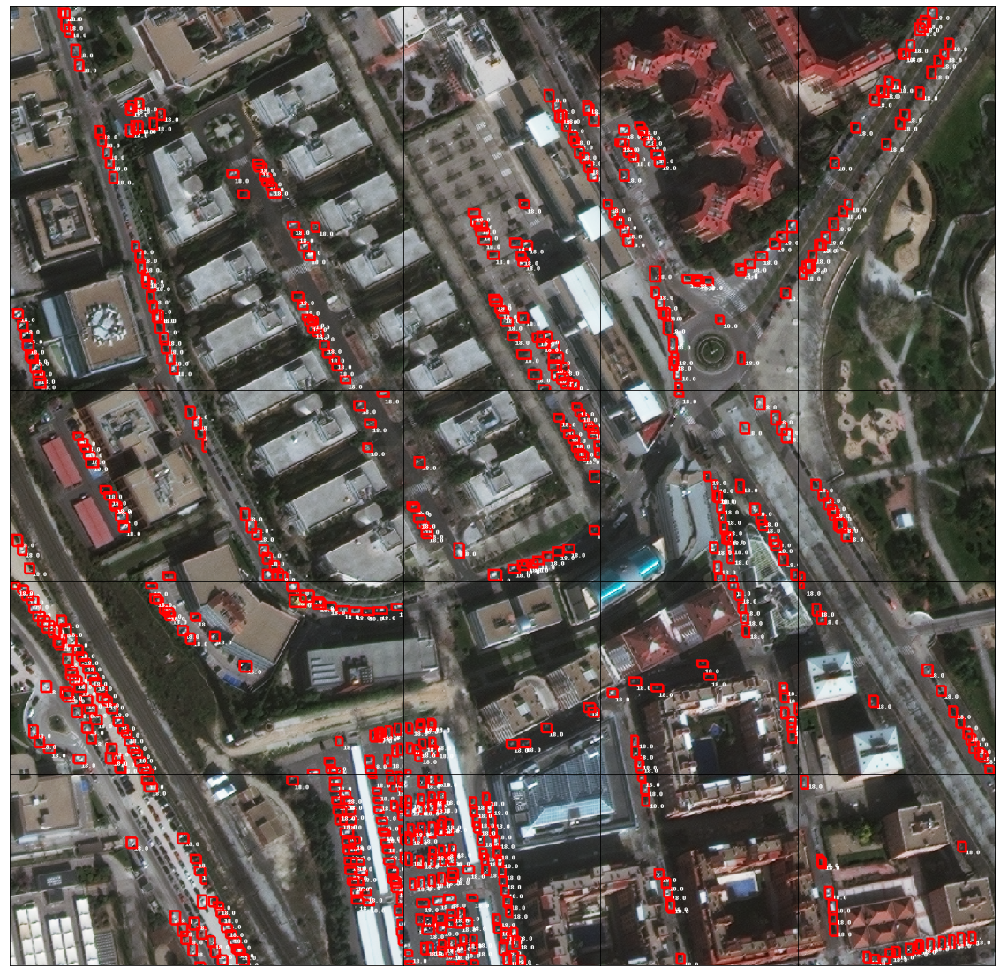

In [117]:
%%time
#putting all together, that is run inference on all patches and save results
path_out = './io_example'
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))
boxes = []
scores = []
classes = []
k = 0
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        for i in tqdm(range(len(patchIDs))):
            eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
            ax = axs[i//5][i%5]
            image = eopatch.data['TRUE-COLOR'][0]
            box,score,clss = run_session(sess,image)
            #only display boxes with confidence > .5
            bfull = box*image.shape[0]
            conf=0.2
            bs = bfull[score > conf]
            cs = clss[score>conf]
            image = draw_bboxes_custom(image,bs,cs)
            ax.imshow(image)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect("auto")
            boxes.append(box)
            scores.append(score)
            classes.append(clss)
            del eopatch
fig.subplots_adjust(wspace=0, hspace=0)

In [115]:
bs.shape

(23, 4)

In [92]:
def draw_bboxes_custom(img,boxes,classes):
    """
    Draw bounding boxes on top of an image

    Args:
        img : Array of image to be modified
        boxes: An (N,4) array of boxes to draw, where N is the number of boxes.
        classes: An (N,1) array of classes corresponding to each bounding box.

    Outputs:
        An array of the same shape as 'img' with bounding boxes
            and classes drawn

    """
    source = Image.fromarray(img)
    draw = ImageDraw.Draw(source)
    w2,h2 = (img.shape[0],img.shape[1])

    idx = 0

    for i in range(len(boxes)):
        ymin,xmin,ymax,xmax = boxes[i]
        c = classes[i]
        if((float(c)==18.0) | (float(c)>1137.0)):#only cars
            draw.text((xmin+15,ymin+15), str(c))

            for j in range(4):
                draw.rectangle(((xmin+j, ymin+j), (xmax+j, ymax+j)), outline="red")
    return source

In [ ]:
# Draw the RGB image
path_out = './io_example'
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

date = datetime.datetime(2019,7,1)

for i in tqdm(range(len(patchIDs))):
    eopatch = EOPatch.load(f'{path_out}/eopatch_{i}', lazy_loading=True)
    ax = axs[i//5][i%5]
    dates = np.array(eopatch.timestamp)
    closest_date_id = np.argsort(abs(date-dates))[0]
    ax.imshow(eopatch.data['TRUE-COLOR'][1])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)